In [25]:
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib.animation import FuncAnimation
from matplotlib.colors import Normalize
from matplotlib import cm 
from IPython.display import HTML

import pandas as pd

import geopandas as gpd


In [2]:
ds_disk = xr.open_dataset("../data/train/CMIP6_train_easternmountain/CMIP6_train_easternmountain.nc")


In [3]:
ds_disk 

<xarray.Dataset> Size: 389MB
Dimensions:      (time: 2557, lon: 25, model: 20, scenario: 4, lat: 19)
Coordinates:
  * time         (time) datetime64[ns] 20kB 2015-01-01T12:00:00 ... 2021-12-3...
  * lon          (lon) float64 200B -83.62 -83.38 -83.12 ... -77.88 -77.62
  * model        (model) object 160B 'ACCESS-CM2' 'ACCESS-ESM' ... 'UKESM1-0-L'
  * lat          (lat) float64 152B 35.12 35.38 35.62 ... 39.12 39.38 39.62
  * scenario     (scenario) object 32B 'ssp126' 'ssp245' 'ssp370' 'ssp585'
Data variables:
    tasmin       (model, scenario, time, lat, lon) float32 389MB ...
    spatial_ref  int32 4B ...
Attributes: (12/22)
    Conventions:           CF-1.7
    activity:              NEX-GDDP-CMIP6
    cmip6_institution_id:  CSIRO-ARCCSS
    cmip6_license:         CC-BY 4.0
    cmip6_source_id:       ACCESS-CM2
    contact:               Dr. Rama Nemani: rama.nemani@nasa.gov, Dr. Bridget...
    ...                    ...
    scenario:              ssp126
    source:                BCSD
    title:                 ACCESS-CM2, r1i1p1f1, ssp126, global downscaled CM...
    tracking_id:           a01a00dd-787d-4327-86e4-f77e815ef7ee
    variant_label:         r1i1p1f1
    version:               1.1

In [4]:
df = ds_disk.to_dataframe()

In [5]:
# convert F from K
df['tasmin'] = df['tasmin'].apply(lambda x: (x-273.15) * 9/5+32)

In [112]:
# (lat, lon) from CMIP6
coordinates = set([(i[4],i[1]) for i in df.index])
coordinates = list(coordinates )

In [114]:
coordinates

[(36.375, -80.875),
 (36.375, -80.625),
 (36.375, -80.375),
 (36.375, -80.125),
 (37.875, -77.875),
 (37.875, -77.625),
 (37.125, -80.875),
 (37.125, -80.625),
 (37.125, -80.375),
 (37.125, -80.125),
 (35.625, -82.875),
 (35.625, -82.625),
 (35.625, -82.375),
 (35.625, -82.125),
 (38.125, -79.875),
 (38.125, -79.625),
 (38.125, -79.375),
 (38.125, -79.125),
 (38.625, -80.125),
 (38.625, -80.625),
 (38.625, -80.375),
 (38.625, -80.875),
 (39.625, -80.875),
 (39.625, -80.625),
 (39.625, -80.375),
 (39.625, -80.125),
 (37.875, -82.875),
 (37.875, -82.625),
 (37.875, -82.375),
 (37.875, -82.125),
 (35.375, -82.875),
 (35.375, -82.625),
 (35.375, -82.375),
 (35.375, -82.125),
 (36.375, -81.875),
 (36.375, -81.625),
 (36.375, -81.375),
 (36.375, -81.125),
 (37.125, -81.875),
 (37.125, -81.625),
 (37.125, -81.375),
 (37.125, -81.125),
 (39.375, -80.875),
 (39.375, -80.625),
 (39.375, -80.375),
 (39.375, -80.125),
 (37.625, -82.875),
 (37.625, -82.625),
 (37.625, -82.375),
 (37.625, -82.125),


In [105]:
len(coordinates)

500

In [56]:
df.head()

tasmin  spatial_ref
time                lon     model      scenario lat                          
2015-01-01 12:00:00 -83.625 ACCESS-CM2 ssp126   35.125 -6.727477            0
                                                35.375       NaN            0
                                                35.625       NaN            0
                                                35.875       NaN            0
                                                36.125       NaN            0

## Visualize one coordinate, one CM, one scenario

In [29]:
dyrus = df.loc[:,-83.625,'ACCESS-CM2','ssp126',35.125]

Text(0.5, 1.0, 'tasmin for (-83.625,35.125) for ACCESS-CM2, ssp126')

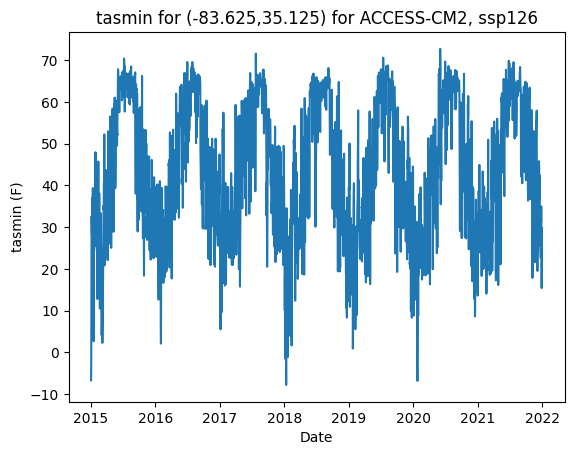

In [33]:
plt.plot(dyrus['tasmin'])
plt.ylabel('tasmin (F)')
plt.xlabel('Date')
plt.title('tasmin for (-83.625,35.125) for ACCESS-CM2, ssp126')

## Visualize one coordinate, one CM, All scenarios

In [52]:
oddone =  df.loc[:,-83.625,:,:,35.125]


In [53]:
oddone.reset_index(['model','scenario','time'], inplace=True)

In [54]:
oddone 

,time,model,scenario,tasmin,spatial_ref
0,2015-01-01 12:00:00,ACCESS-CM2,ssp126,-6.727477,0
1,2015-01-01 12:00:00,ACCESS-CM2,ssp245,-5.954946,0
2,2015-01-01 12:00:00,ACCESS-CM2,ssp370,-5.796962,0
3,2015-01-01 12:00:00,ACCESS-CM2,ssp585,-6.598387,0
4,2015-01-01 12:00:00,ACCESS-ESM,ssp126,32.335347,0
...,...,...,...,...,...
204555,2021-12-31 12:00:00,TaiESM1,ssp585,21.207844,0
204556,2021-12-31 12:00:00,UKESM1-0-L,ssp126,-15.881533,0
204557,2021-12-31 12:00:00,UKESM1-0-L,ssp245,23.879719,0
204558,2021-12-31 12:00:00,UKESM1-0-L,ssp370,28.921455,0


Text(0.5, 1.0, 'tasmin for (-83.625,35.125) for ALL CM and scenarios')

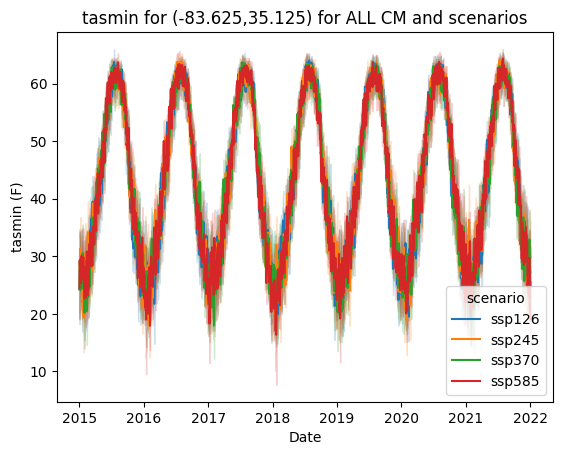

In [55]:
# https://seaborn.pydata.org/generated/seaborn.lineplot.html

sns.lineplot(data = oddone, x = 'time', y = 'tasmin', hue = 'scenario')
plt.ylabel('tasmin (F)')
plt.xlabel('Date')
plt.title('tasmin for (-83.625,35.125) for ALL CM and scenarios' )

## Visualize All CM and Scenarios, facet by Coordinates

In [161]:
xspecial = df.reset_index()

# total coordinates is 475, too large to plot, so reduced to 10 coordinates
select_coordinates = list(coordinates)[:10]

xspecial = xspecial[xspecial['lon'].isin([-83.625,37.875,37.125])]

xspecial['coordinates'] = xspecial['lat'].astype(str) + "-" + xspecial['lon'].astype(str)

In [133]:
len(xspecial.coordinates.unique())

19

In [74]:
#sns.lineplot(data=xspecial, x="time", y="tasmin", hue="scenario", col = "coordinates")


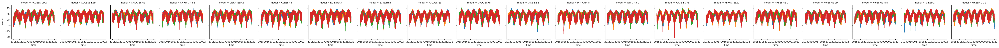

In [160]:
# https://seaborn.pydata.org/generated/seaborn.FacetGrid.html


g = sns.FacetGrid(xspecial, col="model", hue = 'scenario') 
g.map(sns.lineplot, "time", "tasmin")

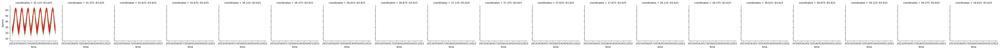

In [166]:
# show up empty because of NAs

g = sns.FacetGrid(xspecial, col="coordinates", hue = 'scenario') 
g.map(sns.lineplot, "time", "tasmin")

## Map Plots

In [ ]:
# https://docs.xarray.dev/en/stable/examples/visualization_gallery.html

One Area, one model, one scenario, one time step

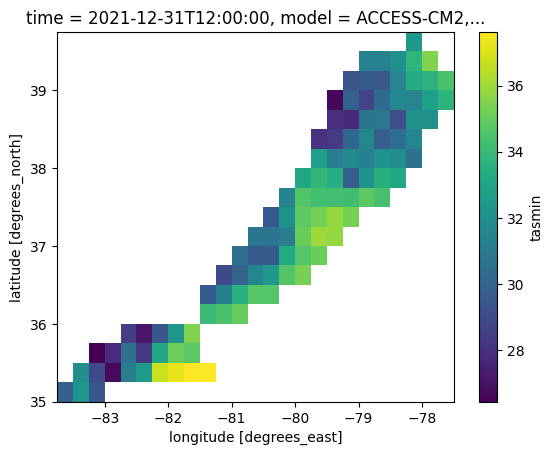

In [204]:
((ds_disk.tasmin.isel(time = -1, model = 0, scenario = 0) - 273.15)*9/5+32).plot()


## One Area, one model, one scenario, multi-time step

In [7]:
ds_resampled = ds_disk.resample(time = 'ME').mean()

In [8]:
df2 = ds_resampled.to_dataframe()

In [9]:
df2['tasmin'] = df2['tasmin'].apply(lambda x: (x-270.15) * 9/5 +32)

In [10]:
df2 = df2.reset_index(['lon','lat', 'time'])

In [11]:
 gdf = gpd.GeoDataFrame(
    df2, geometry=gpd.points_from_xy(df2.lon, df2.lat), crs="EPSG:4326"
)

In [12]:
dates = pd.date_range(df2.time.min(), df2.time.max(), freq='ME')

In [13]:
vmin = 25
vmax = 40

In [14]:
states = gpd.read_file('../data/external/cb_2018_us_state_5m/cb_2018_us_state_5m.shp')
states = states.to_crs("EPSG:4326") 

east = states[states['STUSPS'].isin(['VA','NC','WV','MD','PA'])]

In [97]:
colors = 'Blues'

fig, [ax,cax] = plt.subplots(1, 2, figsize = (10,5), gridspec_kw={"width_ratios":[50,1]})

cmap = cm.ScalarMappable(Normalize(vmin, vmax), colors)

#Create the colorbar with colormap
plt.colorbar(mappable = cmap, cax = cax)
cax.set_title('tsmin')

#We'll pass this function to FuncAnimation to create the animation
def plot_frame(ts):

    gdf2 = gdf.loc['ACCESS-CM2', 'ssp126']

    
    ax.set_title('Eastern US tsmin: {}'.format(dates[ts]))
    ax.set_xlabel('longitude')
    ax.set_ylabel('latitude')
    
    east.plot(color = 'grey', ax = ax) 

    gdf2[(gdf2['time'].dt.year == dates[ts].year) & (gdf2['time'].dt.month == dates[ts].month) ].plot(column = 'tasmin', ax= ax,
                                          vmin = vmin, vmax=vmax,
                                          cmap = colors)

    plt.close()

# To solve for the interval argument in FuncAnimation
# TBD.

anim = FuncAnimation(fig, plot_frame,  
                    frames = range(0,len(dates)),
                    #frames = range(0,10),
                    interval = 100)


HTML(anim.to_jshtml())

C:\Users\manwi\AppData\Local\Temp\ipykernel_25632\861070915.py:21: PerformanceWarning: indexing past lexsort depth may impact performance.
  gdf2 = gdf.loc['ACCESS-CM2', 'ssp126']
C:\Users\manwi\AppData\Local\Temp\ipykernel_25632\861070915.py:21: PerformanceWarning: indexing past lexsort depth may impact performance.
  gdf2 = gdf.loc['ACCESS-CM2', 'ssp126']
C:\Users\manwi\AppData\Local\Temp\ipykernel_25632\861070915.py:21: PerformanceWarning: indexing past lexsort depth may impact performance.
  gdf2 = gdf.loc['ACCESS-CM2', 'ssp126']
C:\Users\manwi\AppData\Local\Temp\ipykernel_25632\861070915.py:21: PerformanceWarning: indexing past lexsort depth may impact performance.
  gdf2 = gdf.loc['ACCESS-CM2', 'ssp126']
C:\Users\manwi\AppData\Local\Temp\ipykernel_25632\861070915.py:21: PerformanceWarning: indexing past lexsort depth may impact performance.
  gdf2 = gdf.loc['ACCESS-CM2', 'ssp126']
C:\Users\manwi\AppData\Local\Temp\ipykernel_25632\861070915.py:21: PerformanceWarning: indexing past

## One Area, one model, All scenario, multi-time step

Loading all models for all scenarios is not feasible to run locally.

In [149]:
scenarios = ['ssp126','ssp245','ssp370','ssp585']

fig, [ax1,ax2] = plt.subplots(2, 2, figsize = (10,10), gridspec_kw = {"width_ratios":[75,75]})

colors = 'Blues'


#Create the colorbar with colormap
cmap = cm.ScalarMappable(Normalize(vmin, vmax), colors)


#We'll pass this function to FuncAnimation to create the animation
def plot_frame(ts):

    gdf2 = gdf.loc['ACCESS-CM2']
    gdf2 = gdf2.reset_index()

    scenario = 0
    
    for ax in [ax1,ax2]:
        for col in range(2):

            east.plot(color = 'grey', ax = ax[col]) 

            gdf2[(gdf2['time'].dt.year == dates[ts].year) & (gdf2['time'].dt.month == dates[ts].month) & (gdf2['scenario'] == scenarios[scenario])].plot(column = 'tasmin', ax= ax[col],
                                            vmin = vmin, vmax=vmax, cmap = colors)

            ax[col].set_title(f'Scenario: {scenarios[scenario]}')
            scenario += 1

    # https://matplotlib.org/stable/users/explain/axes/colorbar_placement.html
    #fig.colorbar(mappable = cmap, cax = cax, ax=ax2[1], location = 'right')


    fig.suptitle(f'US East [ACCESS-CM2]: {dates[ts].year}-{dates[ts].month}-01') 

    plt.close()

# To solve for the interval argument in FuncAnimation
# TBD.

anim = FuncAnimation(fig, plot_frame,  
                    frames = range(0,len(dates)),
                    #frames = range(0,2),
                    interval = 100)


HTML(anim.to_jshtml())